# Follicle sample

In [1]:
import SuperPixel
import matplotlib.pyplot as plt
from scipy.io import loadmat,savemat
import numpy as np
import Expand
import Plot

In [2]:
fp=['data/canceer/ROI2']

## Feature Engineer

In [ ]:
import Feature
for file_path in fp:
    name=Feature.pearson_pbps(file_path)
    savemat('name.mat',{'name':name})

## Preprocessing

data/canceer/ROI2


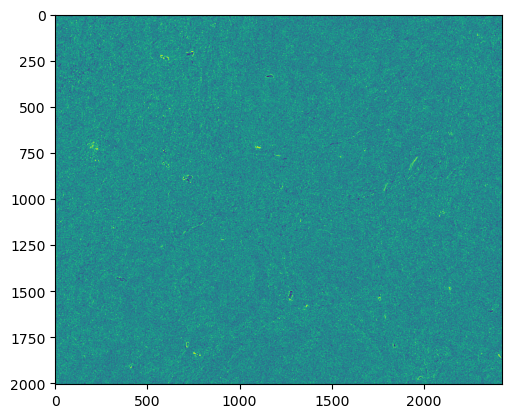

In [3]:
for file_path in fp:
    groups, km_labels = SuperPixel.superpixel_pbps(file_path)

## Expand

In [3]:
file_path = fp[0]
groups = loadmat(file_path+'/groups.mat')['groups']
km_labels = loadmat(file_path+'/km_labels.mat')['km_labels']
m11 = loadmat(file_path+'/m11.mat')['CalibratedM11']
back = loadmat(file_path+'/back.mat')['posi']
collagen = loadmat(file_path+'/pbps/PLsubrL.mat')['PLsubrL']

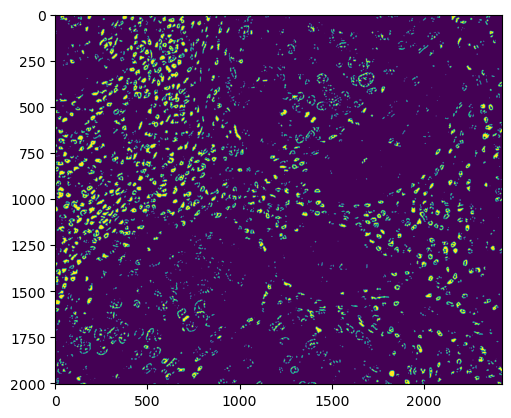

In [5]:
select = m11 < 0.2
plt.imshow(select)

percent10
(56,)


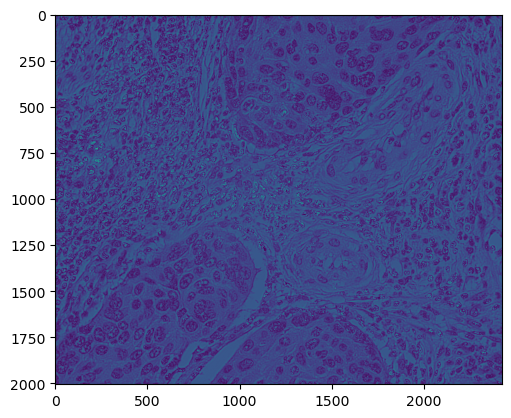

percent20
(112,)


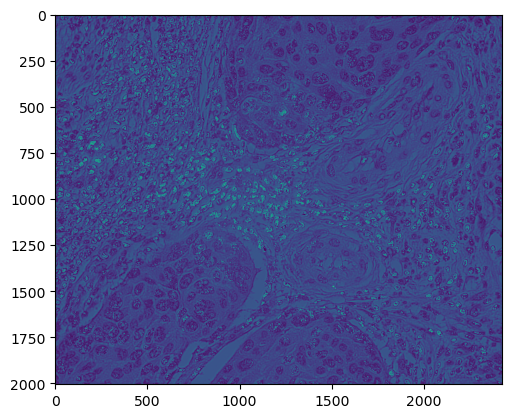

percent30
(168,)


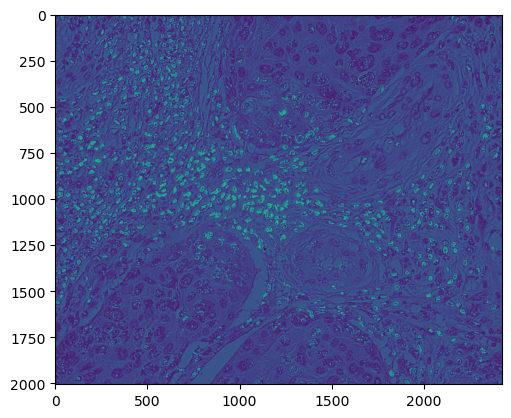

percent40
(225,)


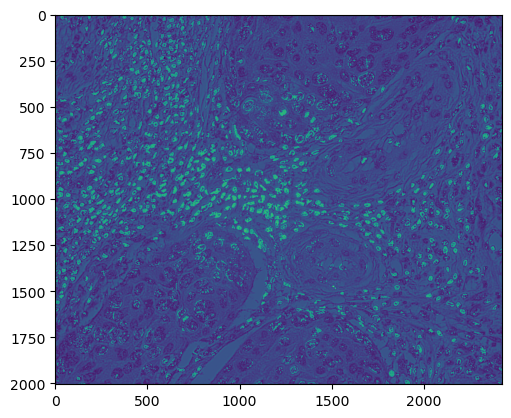

percent50
(281,)


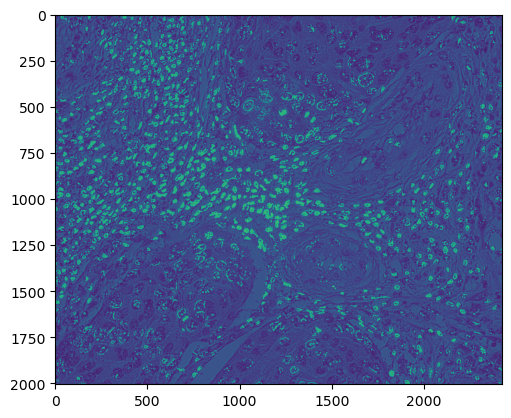

percent60
(337,)


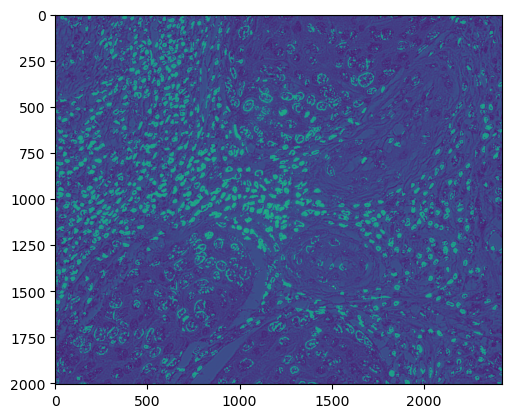

percent70
(394,)


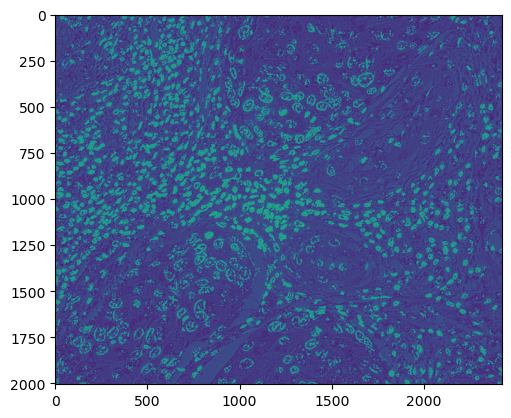

percent80
(450,)


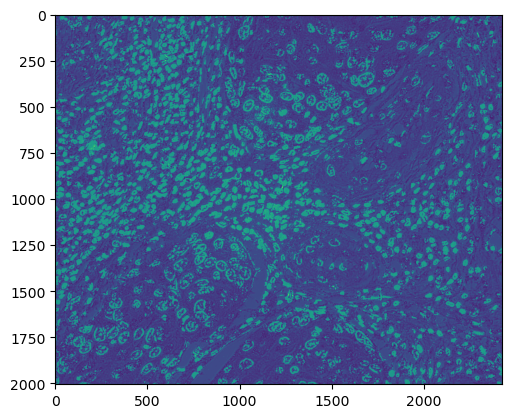

percent90
(506,)


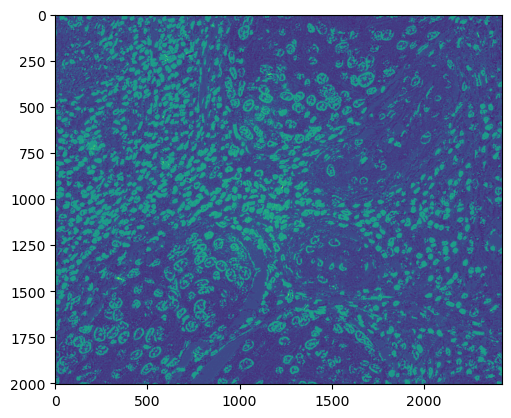

percent100
(563,)


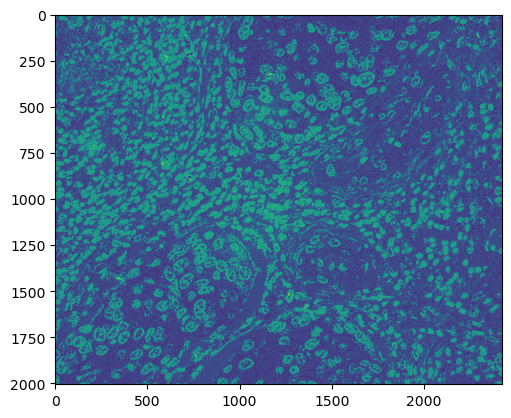

In [6]:
mask = np.zeros(select.shape[:2])
mask[600:1000,0:300] = 1
mask[200:400,400:600] = 1
mask[900:1100,1000:1200] = 1
mask[1000:1200,1900:2300] = 1
mask[1500:1750,2000: ] = 1
interest_sp = mask * select * km_labels
plt.imshow(interest_sp)
contribute=Expand.counts_expand(interest_sp)
contri=Expand.plot_percent(contribute, file_path)

## Iter

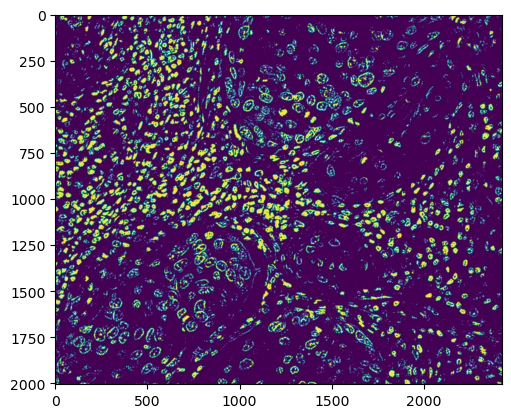

In [7]:
per = contri[5]
result = np.zeros(m11.shape)
for num in per:
    result[km_labels==num] = 1
plt.imshow(result)

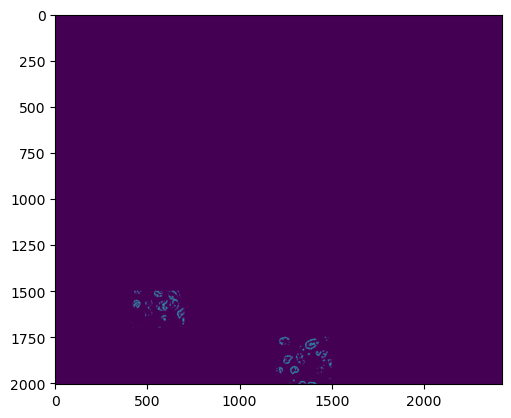

In [12]:
mask = np.zeros(result.shape[:2])
mask[1500:1700,400:700]=1
mask[1750:,1200:1500]=1
negative = mask*result*km_labels
plt.imshow(negative)

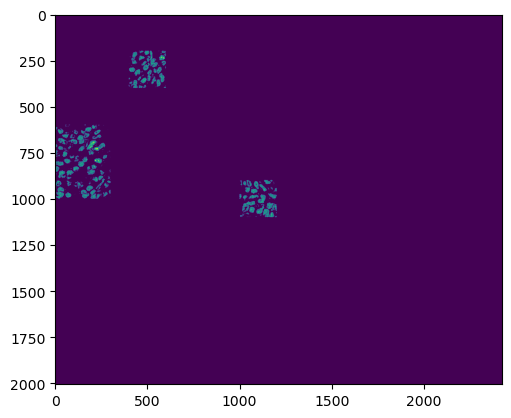

In [13]:
mask = np.zeros(result.shape[:2])
mask[600:1000,0:300]=1
mask[200:400,400:600]=1
mask[900:1100,1000:1200]=1
positive = mask*result*km_labels
plt.imshow(positive)

percent10
(31,)


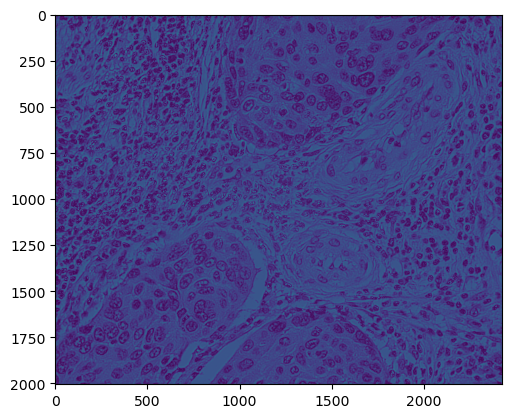

percent20
(63,)


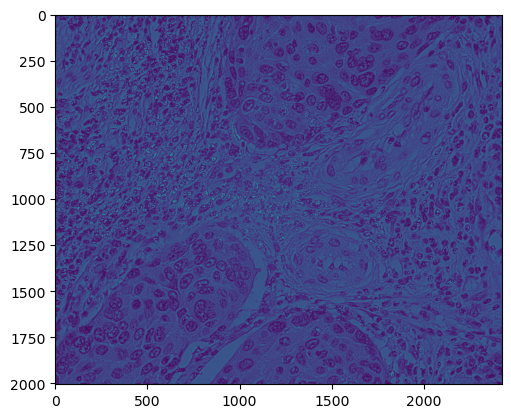

percent30
(95,)


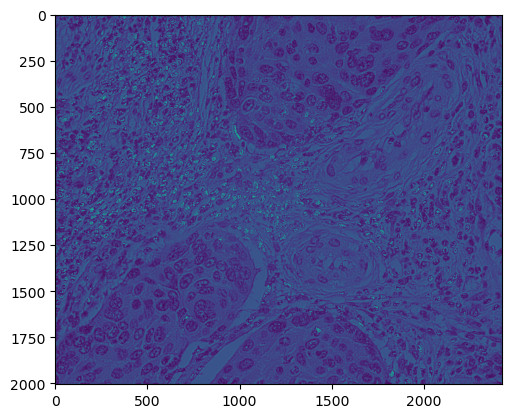

percent40
(126,)


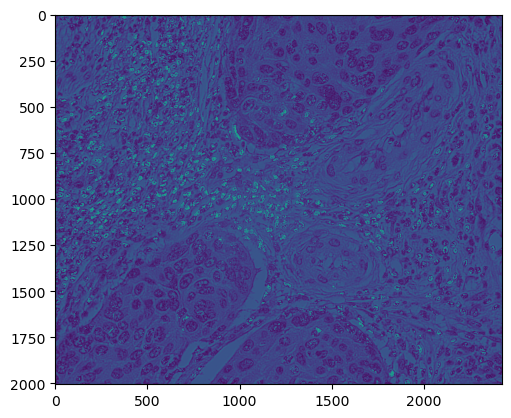

percent50
(158,)


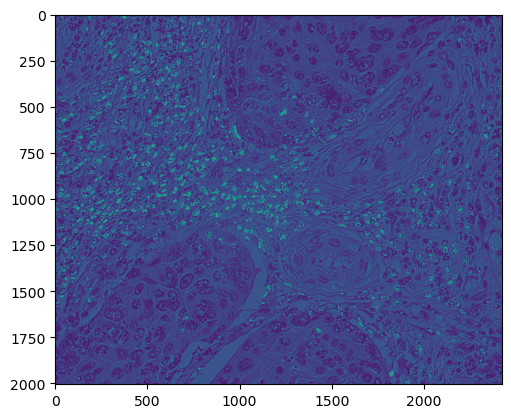

percent60
(190,)


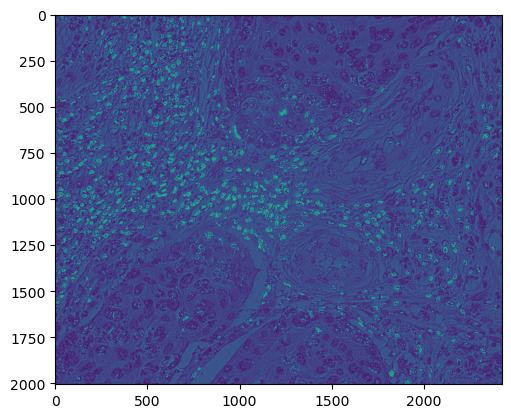

percent70
(221,)


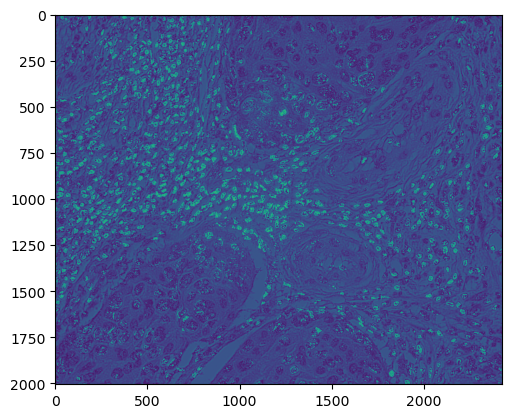

percent80
(253,)


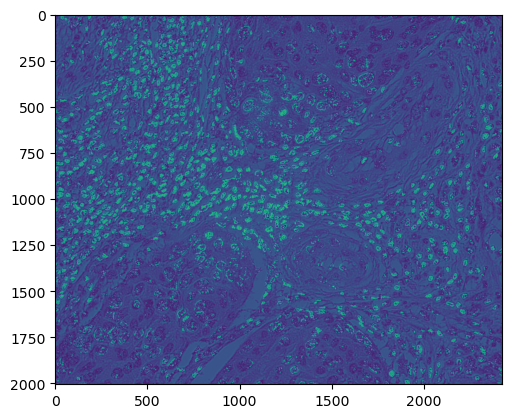

percent90
(285,)


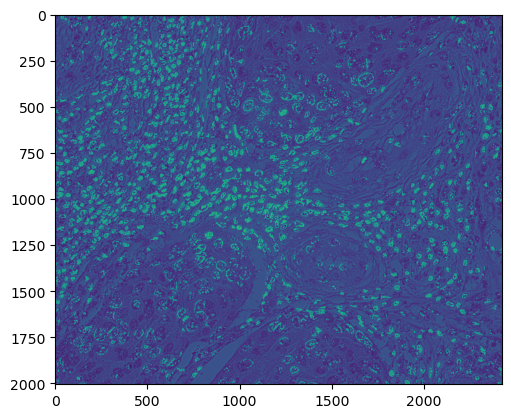

percent100
(317,)


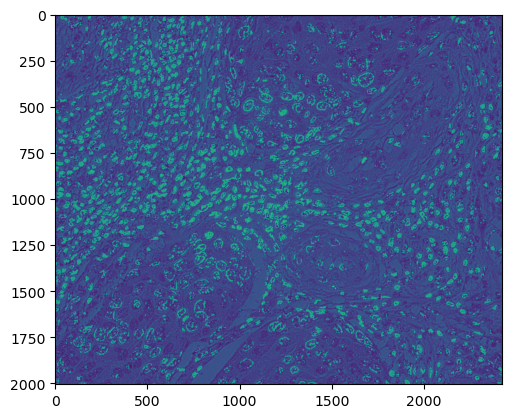

In [14]:
contribute=Expand.positive_negative(positive, negative)
contri1=Expand.plot_percent(contribute, file_path)

In [20]:
np.shape(contribute)

(317, 2)

(158,)


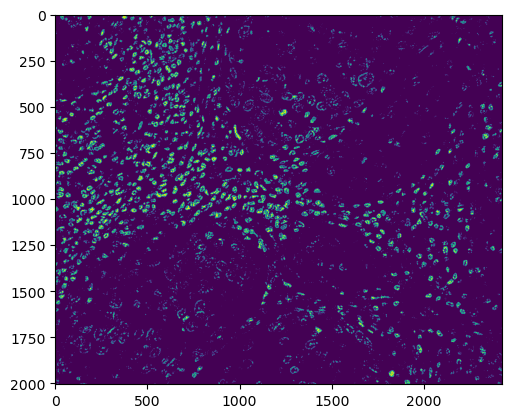

In [22]:
nucleus_normal=contri1[4]
print(np.shape(nucleus_normal))
result = np.zeros(m11.shape)
for num in nucleus_normal:
    result[km_labels==num] = 1
plt.imshow(result)
savemat(file_path+'/nucleus_normal.mat',{'nucleus_normal':nucleus_normal,'contribute':contribute})

In [176]:
nucleus_normal = loadmat(file_path+'/nucleus_normal.mat')['nucleus_normal']
graph = loadmat(file_path+'/graph.mat')['graph']
data=[]
print(np.shape(collagen))
for i in collagen:
    nucleus_normal=i
for index in nucleus_normal:
    index=int(index)
    data.append(graph[index])

(2005, 2421)


In [175]:
np.shape(data)

(2421, 2080)

In [ ]:
import pandas as pd
import seaborn as sns
Data = pd.DataFrame(np.transpose(data))
plt.subplots(figsize = (40,30))
sns.heatmap(Data.corr().abs())
plt.savefig('cor.jpg',dpi=1000,bbox_inches='tight')

In [8]:
import pandas as pd
import seaborn as sns
from scipy.io import loadmat,savemat
import numpy as np

pbps = loadmat("/test"+"/pbps.mat")['pbps']
print(np.shape(pbps))
nRows, nCols, nDims = np.shape(pbps)

(1861, 2271, 19)


In [7]:
data = pd.DataFrame(pbps.reshape(pbps.shape[0]*pbps.shape[1],pbps.shape[2]))
print(data.corr().abs())

          0         1         2         3         4         5         6   \
0   1.000000  0.476700  0.325841  0.325841  0.741430  0.045543  0.274936   
1   0.476700  1.000000  0.707663  0.707663  0.526862  0.284573  0.528182   
2   0.325841  0.707663  1.000000  1.000000  0.424123  0.642280  0.685600   
3   0.325841  0.707663  1.000000  1.000000  0.424123  0.642280  0.685600   
4   0.741430  0.526862  0.424123  0.424123  1.000000  0.024817  0.266154   
5   0.045543  0.284573  0.642280  0.642280  0.024817  1.000000  0.292394   
6   0.274936  0.528182  0.685600  0.685600  0.266154  0.292394  1.000000   
7   0.229478  0.247045  0.199317  0.199317  0.346242  0.139099  0.182942   
8   0.080091  0.387224  0.693857  0.693857  0.147979  0.692997  0.054346   
9   0.193858  0.404171  0.566892  0.566892  0.228387  0.321578  0.116270   
10  0.610921  0.297283  0.225079  0.225079  0.390057  0.059527  0.202410   
11  0.515646  0.684998  0.849896  0.849896  0.535030  0.417724  0.603873   
12  0.401520

In [14]:
import h5py
pbps = h5py.File('E:/test/pbps'+'/pbps.mat')['pbps']
pbps = np.transpose(pbps)

In [15]:
print(np.shape(pbps))

(1861, 2271, 64)


In [18]:
pbps_name =  ["FinalM14", "FinalM41", "FinalM44",
                  "MMT_t1", "MMT_b", "MMT_b2", "MMT_A", "MMT_Abrio_R", "MMT_beta", "Bhls", "Bfs",
                  "MMT_t_1213", "MMT_t_2131", "MMT_t_4243", "MMT_t_2434", "PDxcheng", "rqxcheng", "MMTPD", "MMTrq",
                  "PLsubDL", "rLsubqL", "PLsubrL", "DLsubqL", "PDslcha", "rqslcha", "MM_Det", "MM_Norm", "MM_Trace",
                  "P_vec", "D_vec", "P_dot_D", "LDOP",
                  "MMT_P1","MMT_P2","MMT_P3","MMT_P4","MMT_P5","MMT_P6","MMT_P7","MMT_P8","MMT_P9","MMT_P10","MMT_P11","MMT_P12",
                  "E1","E2","E3","E4","E5","E6","Es",
                  "MMPD_D", "MMPD_delta", "MMPD_R",
                  "MMCD_lambda1", "MMCD_lambda2", "MMCD_lambda3", "MMCD_lambda4", "MMCD_P1", "MMCD_P2", "MMCD_P3","MMCD_PI", "MMCD_PD", "MMCD_S"]
data = pd.DataFrame(pbps.reshape(pbps.shape[0]*pbps.shape[1],pbps.shape[2]), columns=pbps_name)

In [17]:
print(np.shape(pbps_name))

(64,)


<Axes: >

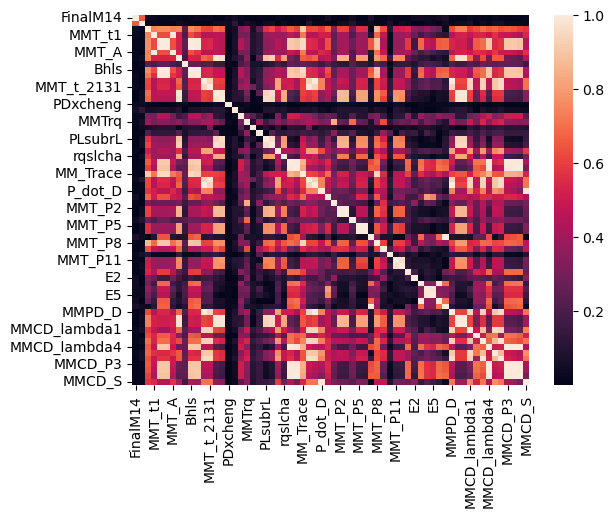

In [26]:
sns.heatmap(data.corr().abs())